In [1]:
import pandas as pd
from scipy.io import arff
import numpy as np

data_file="/Users/pooria/Desktop/CIND 119 Final Project/project_datasets/customer_churn/churn.arff"

data=arff.loadarff(data_file)

df=pd.DataFrame(data[0])
df=df.drop(columns=['Phone Number'])

for col in df.columns:
  if df[col].dtype=='object':
    #making sure data is not read as bytes but as string values from a file
    df[col] = df[col].str.decode('utf-8')
#Look at loaded data and data types
print(df.dtypes)



State                            object
Account Length                  float64
Area Code                        object
Inter Plan                       object
VoiceMail Plan                   object
No of Vmail Mesgs               float64
Total Day Min                   float64
Total Day calls                 float64
Total Day Charge                float64
Total Evening Min               float64
Total Evening Calls             float64
Total Evening Charge            float64
Total Night Minutes             float64
Total Night Calls               float64
Total Night Charge              float64
Total Int Min                   float64
Total Int Calls                 float64
Total Int Charge                float64
No of Calls Customer Service    float64
Churn                            object
dtype: object


In [2]:
# Let's display first 10 records 
df.head(10)


,State,Account Length,Area Code,Inter Plan,VoiceMail Plan,No of Vmail Mesgs,Total Day Min,Total Day calls,Total Day Charge,Total Evening Min,Total Evening Calls,Total Evening Charge,Total Night Minutes,Total Night Calls,Total Night Charge,Total Int Min,Total Int Calls,Total Int Charge,No of Calls Customer Service,Churn
0,OH,107.0,A415,no,yes,26.0,161.6,123.0,27.47,195.5,103.0,16.62,254.4,103.0,11.45,13.7,3.0,3.70,1.0,FALSE
1,NJ,137.0,A415,no,no,0.0,243.4,114.0,41.38,121.2,110.0,10.30,162.6,104.0,7.32,12.2,5.0,3.29,0.0,FALSE
2,OH,84.0,A408,yes,no,0.0,299.4,71.0,50.90,61.9,88.0,5.26,196.9,89.0,8.86,6.6,7.0,1.78,2.0,FALSE
3,OK,75.0,A415,yes,no,0.0,166.7,113.0,28.34,148.3,122.0,12.61,186.9,121.0,8.41,10.1,3.0,2.73,3.0,FALSE
4,AL,118.0,A510,yes,no,0.0,223.4,98.0,37.98,220.6,101.0,18.75,203.9,118.0,9.18,6.3,6.0,1.70,0.0,FALSE
5,MA,121.0,A510,no,yes,24.0,218.2,88.0,37.09,348.5,108.0,29.62,212.6,118.0,9.57,7.5,7.0,2.03,3.0,FALSE
6,MO,147.0,A415,yes,no,0.0,157.0,79.0,26.69,103.1,94.0,8.76,211.8,96.0,9.53,7.1,6.0,1.92,0.0,FALSE
7,LA,117.0,A408,no,no,0.0,184.5,97.0,31.37,351.6,80.0,29.89,215.8,90.0,9.71,8.7,4.0,2.35,1.0,FALSE
8,WV,141.0,A415,yes,yes,37.0,258.6,84.0,43.96,222.0,111.0,18.87,326.4,97.0,14.69,11.2,5.0,3.02,0.0,FALSE
9,IN,65.0,A415,no,no,0.0,129.1,137.0,21.95,228.5,83.0,19.42,208.8,111.0,9.40,12.7,6.0,3.43,4.0,TRUE


In [ ]:
df=df.drop(columns=['Phone Number'])


In [3]:
# look at meta information about data, such as null values
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 20 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   State                         3333 non-null   object 
 1   Account Length                3333 non-null   float64
 2   Area Code                     3333 non-null   object 
 3   Inter Plan                    3333 non-null   object 
 4   VoiceMail Plan                3333 non-null   object 
 5   No of Vmail Mesgs             3333 non-null   float64
 6   Total Day Min                 3333 non-null   float64
 7   Total Day calls               3333 non-null   float64
 8   Total Day Charge              3333 non-null   float64
 9   Total Evening Min             3333 non-null   float64
 10  Total Evening Calls           3333 non-null   float64
 11  Total Evening Charge          3333 non-null   float64
 12  Total Night Minutes           3333 non-null   float64
 13  Tot

In [25]:
# Let's see meta information about numeric data, we can also see if there any extreme values
df.describe()

,Account Length,No of Vmail Mesgs,Total Day Min,Total Day calls,Total Day Charge,Total Evening Min,Total Evening Calls,Total Evening Charge,Total Night Minutes,Total Night Calls,Total Night Charge,Total Int Min,Total Int Calls,Total Int Charge,No of Calls Customer Service
count,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000
mean,101.064806,8.099010,179.775098,100.435644,30.562307,200.980348,100.114311,17.083540,200.872037,100.107711,9.039325,10.237294,4.479448,2.764581,1.562856
std,39.822106,13.688365,54.467389,20.069084,9.259435,50.713844,19.922625,4.310668,50.573847,19.568609,2.275873,2.791840,2.461214,0.753773,1.315491
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.200000,33.000000,1.040000,0.000000,0.000000,0.000000,0.000000
25%,74.000000,0.000000,143.700000,87.000000,24.430000,166.600000,87.000000,14.160000,167.000000,87.000000,7.520000,8.500000,3.000000,2.300000,1.000000
50%,101.000000,0.000000,179.400000,101.000000,30.500000,201.400000,100.000000,17.120000,201.200000,100.000000,9.050000,10.300000,4.000000,2.780000,1.000000
75%,127.000000,20.000000,216.400000,114.000000,36.790000,235.300000,114.000000,20.000000,235.300000,113.000000,10.590000,12.100000,6.000000,3.270000,2.000000
max,243.000000,51.000000,350.800000,165.000000,59.640000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


#  Categorical to One-Hot (numeric) Encoding 


In [4]:
#Let's create a list for our categorical columns for German dataset, we need this later

cat_cols=["State","Area Code", "Inter Plan","VoiceMail Plan"]
#******


In [5]:
# Create a copy of the data frame in memory with a different name
df_onehot=df.copy()
#convert only categorical variables/features to dummy/one-hot features
df_onehot = pd.get_dummies(df, columns=cat_cols, prefix = cat_cols)
#print the dataset
df_onehot


,Account Length,No of Vmail Mesgs,Total Day Min,Total Day calls,Total Day Charge,Total Evening Min,Total Evening Calls,Total Evening Charge,Total Night Minutes,Total Night Calls,...,State_WI,State_WV,State_WY,Area Code_A408,Area Code_A415,Area Code_A510,Inter Plan_no,Inter Plan_yes,VoiceMail Plan_no,VoiceMail Plan_yes
0,107.0,26.0,161.6,123.0,27.47,195.5,103.0,16.62,254.4,103.0,...,False,False,False,False,True,False,True,False,False,True
1,137.0,0.0,243.4,114.0,41.38,121.2,110.0,10.30,162.6,104.0,...,False,False,False,False,True,False,True,False,True,False
2,84.0,0.0,299.4,71.0,50.90,61.9,88.0,5.26,196.9,89.0,...,False,False,False,True,False,False,False,True,True,False
3,75.0,0.0,166.7,113.0,28.34,148.3,122.0,12.61,186.9,121.0,...,False,False,False,False,True,False,False,True,True,False
4,118.0,0.0,223.4,98.0,37.98,220.6,101.0,18.75,203.9,118.0,...,False,False,False,False,False,True,False,True,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,68.0,0.0,231.1,57.0,39.29,153.4,55.0,13.04,191.3,123.0,...,False,True,False,False,True,False,True,False,True,False
3329,28.0,0.0,180.8,109.0,30.74,288.8,58.0,24.55,191.9,91.0,...,False,False,False,False,False,True,True,False,True,False
3330,184.0,0.0,213.8,105.0,36.35,159.6,84.0,13.57,139.2,137.0,...,False,False,False,False,False,True,False,True,True,False
3331,74.0,25.0,234.4,113.0,39.85,265.9,82.0,22.60,241.4,77.0,...,False,False,False,False,True,False,True,False,False,True


In [6]:
# the train test set split
from sklearn.model_selection import train_test_split


class_col_name="Churn"
one_hot_feature_names=df_onehot.columns[df_onehot.columns != class_col_name]
# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(df_onehot.loc[:, one_hot_feature_names], df_onehot[class_col_name], test_size=0.3,random_state=109) # 70% training and 30% test

In [7]:
# Repeat Naive Bayes modeling
from sklearn.naive_bayes import MultinomialNB

#Create a MultiNomial NB Classifier
nb = MultinomialNB()

#Train the model using the training sets
nb.fit(X_train, y_train)

#Predict the response for test dataset
y_pred = nb.predict(X_test)
print ("Succesfully done..")

Succesfully done..


Let's look at Naive Bayes output

In [8]:
print("Number of features used ",nb.n_features_in_)
print("Classes ",nb.classes_)
print("Number of records for classes ",nb.class_count_)
print("Log prior probability for classes ", nb.class_log_prior_)
print("Log conditional probability for each feature given a class\n",nb.feature_log_prob_)

Number of features used  73
Classes  ['FALSE' 'TRUE']
Number of records for classes  [2000.  333.]
Log prior probability for classes  [-0.15400781 -1.94676778]
Log conditional probability for each feature given a class
 [[ -2.34989973  -4.80986187  -1.80148269  -2.36358096  -3.57340585
   -1.67506339  -2.36690534  -4.14012644  -1.66981294  -2.36524177
   -4.77084759  -4.64665445  -5.46069472  -5.95565869  -6.58485462
  -11.07349099 -10.61875483 -11.07349099 -10.85642648 -11.57426628
  -10.93241239 -10.80879844 -11.04363803 -11.13601135 -10.83232893
  -11.20270272 -11.04363803 -11.16880117 -10.61875483 -10.85642648
  -10.74135715 -10.80879844 -11.07349099 -11.07349099 -10.98647961
  -10.9064369  -10.78580892 -10.93241239 -10.76333606 -10.85642648
  -11.04363803 -10.8811191  -10.9064369  -10.83232893 -10.76333606
  -10.95908064 -10.95908064 -10.78580892 -10.85642648 -10.59970664
  -10.63817292 -10.85642648 -10.61875483 -11.23779404 -10.85642648
  -11.39194472 -10.83232893 -11.13601135 -1

We have probailities of a lot more features now.

See evaluation metrics below.

In [10]:
from sklearn.metrics import confusion_matrix
cf=confusion_matrix(y_test, y_pred)
print ("Confusion Matrix")
print(cf)
tn, fp, fn, tp=cf.ravel()
print ("TP: ", tp,", FP: ", fp,", TN: ", tn,", FN:", fn)

Confusion Matrix
[[552 298]
 [ 63  87]]
TP:  87 , FP:  298 , TN:  552 , FN: 63


In [11]:
from sklearn.metrics import classification_report
from sklearn import metrics

print(classification_report(y_test, y_pred))



              precision    recall  f1-score   support

       FALSE       0.90      0.65      0.75       850
        TRUE       0.23      0.58      0.33       150

    accuracy                           0.64      1000
   macro avg       0.56      0.61      0.54      1000
weighted avg       0.80      0.64      0.69      1000



**Let's run decision tree on one-hot encoded data**

class Names ['FALSE' 'TRUE']


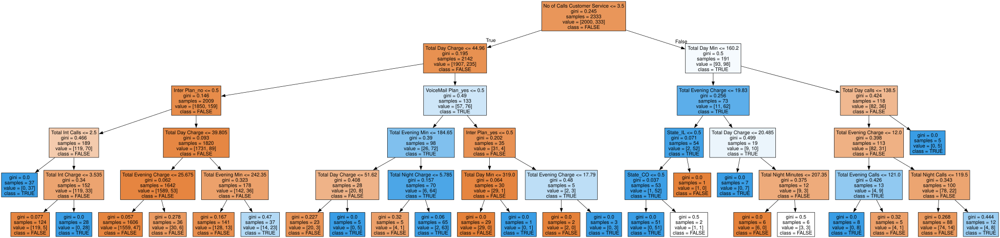

In [12]:
from sklearn import tree
clf = tree.DecisionTreeClassifier(max_depth=5)
clf = clf.fit(X_train, y_train)
import graphviz
#Get unique class values to display on the tree
class_values=df_onehot[class_col_name].unique()
print ("class Names",class_values)

dot_data = tree.export_graphviz(clf, out_file=None, 
                                feature_names=one_hot_feature_names,  
                                class_names=class_values,
                                filled=True)

# Draw graph
graph = graphviz.Source(dot_data, format="png") 
graph


In [13]:
# Perform prediction on the test set
y_pred = clf.predict(X_test)

In [14]:
# Get classification report
from sklearn.metrics import classification_report
from sklearn import metrics

print(classification_report(y_test, y_pred))


              precision    recall  f1-score   support

       FALSE       0.94      0.98      0.96       850
        TRUE       0.83      0.64      0.72       150

    accuracy                           0.93      1000
   macro avg       0.89      0.81      0.84      1000
weighted avg       0.92      0.93      0.92      1000



**Appendix**

**Exploratory Analysis**

We have learnt how to implement classification algorithms in Python but we have just done basic exploratory data analysis in the beginning using info function, describe function,and  head function of Pandas. Here is a very good Python pacakge that performs varirty of the basic analysis by itself and generates a report for you. You can analyze mising values, dupicate values, correlation, etc.


In [37]:
from ydata_profiling import ProfileReport
profile = ProfileReport(df)

In [38]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]